# HACKATHON 2.0 
**Predicting Heart Rate to Monitor Stress Level**

**Group: One-Hot-Ensemble**

Members:

- Tifanny Chang
- Joseph Mansour
- Aaron Coteff
- Bertram Obiesie
- William Daugherty
- Adithya Manoj Kumar

**Goal**:
The goal is to build a regressor model which can predict the heart rate of an individual time domain, frequency domain and non-linear features of such individuals in question.

**Importing Libraries**

In [2]:
import warnings
warnings.filterwarnings('ignore') # Disable warning messages

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline
sns.set(color_codes=True)
sns.set_style(style='darkgrid')
pd.set_option('display.max_columns', None)

from scipy import stats
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso, Ridge, LinearRegression 
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import KFold, cross_val_score, RandomizedSearchCV, GridSearchCV

**Importing Datasets**

In [4]:
frequency = pd.read_csv('frequency_domain_features_train.csv')
heart_rate = pd.read_csv('heart_rate_non_linear_features_train.csv')
time_domain = pd.read_csv('time_domain_features_train.csv')
frequency_test = pd.read_csv('frequency_domain_features_test.csv')
heart_rate_test = pd.read_csv('heart_rate_non_linear_features_test.csv')
time_domain_test = pd.read_csv('time_domain_features_test.csv')

### DATA EXPLORATION

**Frequency Domain Features**

In [5]:
frequency.head(3)

,uuid,VLF,VLF_PCT,LF,LF_PCT,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF
0,89df2855-56eb-4706-a23b-b39363dd605a,2661.894136,72.203287,1009.249419,27.375666,98.485263,15.522603,0.421047,1.514737,3686.666157,65.018055,0.015380
1,80c795e4-aa56-4cc0-939c-19634b89cbb2,2314.265450,76.975728,690.113275,22.954139,99.695397,2.108525,0.070133,0.304603,3006.487251,327.296635,0.003055
2,c2d5d102-967c-487d-88f2-8b005a449f3e,1373.887112,51.152225,1298.222619,48.335104,98.950472,13.769729,0.512671,1.049528,2685.879461,94.280910,0.010607


**Heart Rate Non-Linear Features**

In [6]:
heart_rate.head(3)

,uuid,SD1,SD2,sampen,higuci,datasetId,condition
0,89df2855-56eb-4706-a23b-b39363dd605a,11.001565,199.061782,2.139754,1.163485,2,no stress
1,80c795e4-aa56-4cc0-939c-19634b89cbb2,9.170129,114.634458,2.174499,1.084711,2,interruption
2,c2d5d102-967c-487d-88f2-8b005a449f3e,11.533417,118.939253,2.135350,1.176315,2,interruption


**Time Domain Features**

In [7]:
time_domain.head(3)

,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,KURT,SKEW,MEAN_REL_RR,MEDIAN_REL_RR,SDRR_REL_RR,RMSSD_REL_RR,SDSD_REL_RR,SDRR_RMSSD_REL_RR,KURT_REL_RR,SKEW_REL_RR,uuid
0,885.157845,853.763730,140.972741,15.554505,15.553371,9.063146,69.499952,11.133333,0.533333,-0.856554,0.335218,-0.000203,-0.000179,0.017080,0.007969,0.007969,2.143342,-0.856554,0.335218,89df2855-56eb-4706-a23b-b39363dd605a
1,939.425371,948.357865,81.317742,12.964439,12.964195,6.272369,64.363150,5.600000,0.000000,-0.408190,-0.155286,-0.000059,0.000611,0.013978,0.004769,0.004769,2.930855,-0.408190,-0.155286,80c795e4-aa56-4cc0-939c-19634b89cbb2
2,898.186047,907.006860,84.497236,16.305279,16.305274,5.182201,67.450066,13.066667,0.200000,0.351789,-0.656813,-0.000011,-0.000263,0.018539,0.008716,0.008716,2.127053,0.351789,-0.656813,c2d5d102-967c-487d-88f2-8b005a449f3e


**Size of datasets (rows, columns)**

In [8]:
# Training Set
print("Frequency Domain Features:", frequency.shape)
print("Heart Rate Non-linear:", heart_rate.shape)
print("Time Domain Features:", time_domain.shape)

Frequency Domain Features: (369289, 12)
Heart Rate Non-linear: (369289, 7)
Time Domain Features: (369289, 20)


In [9]:
# Test Set
print("Frequency Domain Features:", frequency.shape)
print("Heart Rate Non-linear:", heart_rate.shape)
print("Time Domain Features:", time_domain.shape)

Frequency Domain Features: (369289, 12)
Heart Rate Non-linear: (369289, 7)
Time Domain Features: (369289, 20)


**Merging Datasets**

In [10]:
df_train = heart_rate.merge(frequency, how = 'inner', on = 'uuid')
df_train = df_train.merge(time_domain, how = 'inner', on = 'uuid')
df_test = heart_rate_test.merge(frequency_test, how = 'inner', on = 'uuid')
df_test = df_test.merge(time_domain_test, how = 'inner', on = 'uuid')

In [11]:
print("Merged training dataset:", df_train.shape)
print("Merged test dataset:", df_test.shape)

Merged training dataset: (369289, 37)
Merged test dataset: (41033, 36)


In [12]:
df_train.head(1)

,uuid,SD1,SD2,sampen,higuci,datasetId,condition,VLF,VLF_PCT,LF,LF_PCT,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,KURT,SKEW,MEAN_REL_RR,MEDIAN_REL_RR,SDRR_REL_RR,RMSSD_REL_RR,SDSD_REL_RR,SDRR_RMSSD_REL_RR,KURT_REL_RR,SKEW_REL_RR
0,89df2855-56eb-4706-a23b-b39363dd605a,11.001565,199.061782,2.139754,1.163485,2,no stress,2661.894136,72.203287,1009.249419,27.375666,98.485263,15.522603,0.421047,1.514737,3686.666157,65.018055,0.01538,885.157845,853.76373,140.972741,15.554505,15.553371,9.063146,69.499952,11.133333,0.533333,-0.856554,0.335218,-0.000203,-0.000179,0.01708,0.007969,0.007969,2.143342,-0.856554,0.335218


In [13]:
df_test.head(1)

,uuid,SD1,SD2,sampen,higuci,datasetId,condition,VLF,VLF_PCT,LF,LF_PCT,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,pNN25,pNN50,KURT,SKEW,MEAN_REL_RR,MEDIAN_REL_RR,SDRR_REL_RR,RMSSD_REL_RR,SDSD_REL_RR,SDRR_RMSSD_REL_RR,KURT_REL_RR,SKEW_REL_RR
0,62b75db5-bc40-4c8f-9166-daf0efcab4c2,8.347898,115.862444,2.209659,1.100715,2,time pressure,1868.532278,76.511189,570.643114,23.366245,99.478197,2.993254,0.122565,0.521803,2442.168645,190.643094,0.005245,934.665288,939.03173,82.139495,11.801781,11.801772,6.959924,3.933333,0.133333,-0.680262,-0.233075,0.000016,0.000288,0.012933,0.004578,0.004578,2.825038,-0.680262,-0.233075


**Dataset Analysis**

In [14]:
df_train.info()  # Checking dataset pertinent info like datatypes, missing values and range. 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 369289 entries, 0 to 369288
Data columns (total 37 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   uuid               369289 non-null  object 
 1   SD1                369289 non-null  float64
 2   SD2                369289 non-null  float64
 3   sampen             369289 non-null  float64
 4   higuci             369289 non-null  float64
 5   datasetId          369289 non-null  int64  
 6   condition          369289 non-null  object 
 7   VLF                369289 non-null  float64
 8   VLF_PCT            369289 non-null  float64
 9   LF                 369289 non-null  float64
 10  LF_PCT             369289 non-null  float64
 11  LF_NU              369289 non-null  float64
 12  HF                 369289 non-null  float64
 13  HF_PCT             369289 non-null  float64
 14  HF_NU              369289 non-null  float64
 15  TP                 369289 non-null  float64
 16  LF

Based on the information above, we have no null values in the training dataset. All datatypes are numeric except for the 'condition' attribute. All columns contain data equal to the total number of entries.

In [15]:
df_train.describe()  # Statistical description of continous features

,SD1,SD2,sampen,higuci,datasetId,VLF,VLF_PCT,LF,LF_PCT,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,KURT,SKEW,MEAN_REL_RR,MEDIAN_REL_RR,SDRR_REL_RR,RMSSD_REL_RR,SDSD_REL_RR,SDRR_RMSSD_REL_RR,KURT_REL_RR,SKEW_REL_RR
count,369289.000000,369289.000000,369289.000000,369289.000000,369289.0,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,3.692890e+05,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000,369289.000000
mean,10.593708,154.178997,2.062471,1.182292,2.0,2199.580170,64.289242,946.530252,34.095182,95.566718,39.245603,1.615576,4.433282,3185.356025,115.977200,0.048506,846.650104,841.965890,109.352531,14.977498,14.976767,7.396597,73.941824,9.841143,0.866001,0.523235,0.041628,-1.756587e-06,-0.000465,0.018571,0.009701,0.009701,2.006817,0.523235,0.041628
std,2.914795,109.170222,0.206999,0.062192,0.0,1815.773422,16.774844,574.171780,16.040290,4.123365,45.398869,1.761073,4.123365,1923.227187,360.855129,0.049238,124.603984,132.321005,77.117025,4.120766,4.120768,5.143834,10.337453,8.195574,0.990189,1.790348,0.699522,1.630256e-04,0.000868,0.005455,0.003897,0.003897,0.375845,1.790348,0.699522
min,3.911344,38.307745,0.434576,1.033984,2.0,159.480176,19.031219,90.048557,2.165119,69.879083,0.061783,0.002150,0.012825,377.692795,2.319952,0.000128,547.492221,517.293295,27.233947,5.529742,5.529630,2.660381,48.737243,0.000000,0.000000,-1.894820,-2.136278,-1.233914e-03,-0.004425,0.008987,0.003220,0.003220,1.169342,-1.894820,-2.136278
25%,8.368340,90.326864,2.032977,1.139929,2.0,1001.189280,52.909877,545.449386,22.305936,93.645734,10.720312,0.346803,1.228054,1828.147788,14.737458,0.012433,760.228533,755.750735,64.205641,11.830959,11.830671,4.541896,66.715776,3.666667,0.000000,-0.352783,-0.359291,-7.281695e-05,-0.000917,0.014261,0.006984,0.006984,1.749801,-0.352783,-0.359291
50%,10.196621,116.221063,2.134214,1.174293,2.0,1667.903111,66.350237,782.716291,32.047025,96.643140,24.841938,1.039513,3.356860,2796.856587,28.789747,0.034735,822.951438,819.689595,82.608243,14.415918,14.415388,5.952112,74.217809,7.600000,0.466667,0.040736,-0.060966,-9.330777e-07,-0.000312,0.017318,0.008691,0.008691,1.934416,0.040736,-0.060966
75%,12.679005,166.764850,2.181929,1.223621,2.0,2654.121052,76.825032,1201.432256,44.647115,98.771946,45.272368,2.245115,6.354266,4052.260157,80.429614,0.067854,924.117422,916.821570,118.237002,17.927144,17.924839,7.919841,80.334937,13.333333,1.466667,0.722833,0.282417,6.911667e-05,0.000131,0.021827,0.011460,0.011460,2.221232,0.722833,0.282417
max,18.836107,796.852945,2.234841,1.361219,2.0,12617.977191,97.738848,3291.548112,77.928847,99.987175,364.486936,13.095664,30.120917,13390.684098,7796.443096,0.431043,1322.016957,1653.122250,563.486949,26.629477,26.629392,54.523950,113.752309,39.400000,5.466667,64.088107,6.777800,1.244098e-03,0.002095,0.036571,0.026955,0.026955,3.724134,64.088107,6.777800


Based on the statistical distribution above, we quickly notice that the 'datasetId' attribute is the same value throughout the dataset. We will drop this attribute as it will not have any effect in our analysis. We will also drop the user id (uuid) as this information is not necessary for our analysis.

In [16]:
# Drop the datasetId and uuid attributes
df_train = df_train.drop(columns = ['datasetId', 'uuid', 'condition'])

In [17]:
df_train.skew() # Checking for skewed data.

SD1                  0.399668
SD2                  2.363386
sampen              -3.091012
higuci               0.335008
VLF                  1.960735
VLF_PCT             -0.410836
LF                   1.349076
LF_PCT               0.425164
LF_NU               -1.645603
HF                   2.476530
HF_PCT               2.021882
HF_NU                1.645603
TP                   1.452435
LF_HF                9.781091
HF_LF                2.159372
MEAN_RR              0.648000
MEDIAN_RR            0.925513
SDRR                 2.363789
RMSSD                0.399529
SDSD                 0.399668
SDRR_RMSSD           3.707939
HR                   0.411721
pNN25                1.203114
pNN50                1.264137
KURT                 5.722209
SKEW                 1.223005
MEAN_REL_RR          0.112796
MEDIAN_REL_RR       -0.948009
SDRR_REL_RR          0.869543
RMSSD_REL_RR         1.258784
SDSD_REL_RR          1.258784
SDRR_RMSSD_REL_RR    0.838587
KURT_REL_RR          5.722209
SKEW_REL_R

The Ratio of LF to HF (LF_HF) seems to have the most skewed data in the set. This is followed by the Kurtosis of distribution of successive RR intervals (KURT) and Kurtosis of distribution of relative RR intervals (KURT_REL_RR) attributes.

**Data Pollution Check**

In [18]:
# Checking for any null values in the train dataset
df_train.isna().sum().sum()

0

In [19]:
df_train.duplicated().any()  # Checking for duplicated data.

False

In [20]:
# Checking all continous columns contain numeric values
num_col = df_train[df_train.columns[~df_train.columns.isin(['uuid', 'condition'])]]
num_col.shape[1] == num_col.select_dtypes(include=np.number).shape[1]

True

### Univariate Plots

**Frequency Domain Features Plots**

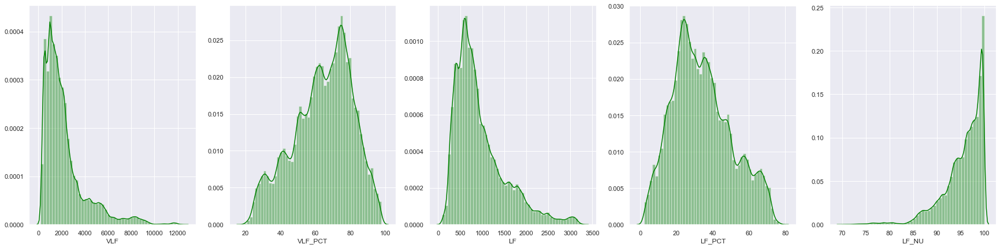

In [20]:
fig, axs = plt.subplots(ncols = 5, figsize = (30, 7))    
sns.distplot(frequency['LF'], color='green', kde=True, ax = axs[2])  
sns.distplot(frequency['LF_PCT'], color='green', kde=True, ax = axs[3])  
sns.distplot(frequency['LF_NU'], color='green', kde=True, ax = axs[4])
sns.distplot(frequency['VLF'], color='green', kde=True, ax = axs[0])
sns.distplot(frequency['VLF_PCT'], color='green', kde=True, ax = axs[1]) 

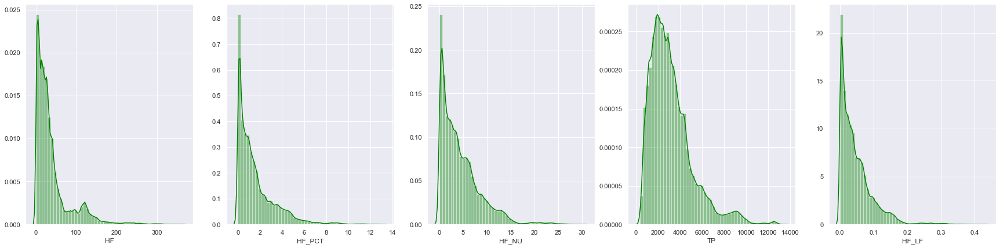

In [21]:
fig, axs = plt.subplots(ncols = 5, figsize = (30, 7))    
sns.distplot(frequency['HF'], color='green', kde=True, ax = axs[0])
sns.distplot(frequency['HF_PCT'], color='green', kde=True, ax = axs[1])  
sns.distplot(frequency['HF_NU'], color='green', kde=True, ax = axs[2])   
sns.distplot(frequency['HF_LF'], color='green', kde=True, ax = axs[4])
sns.distplot(frequency['TP'], color='green', kde=True, ax = axs[3]) 

**Heart Rate Non-Linear Features Plots**

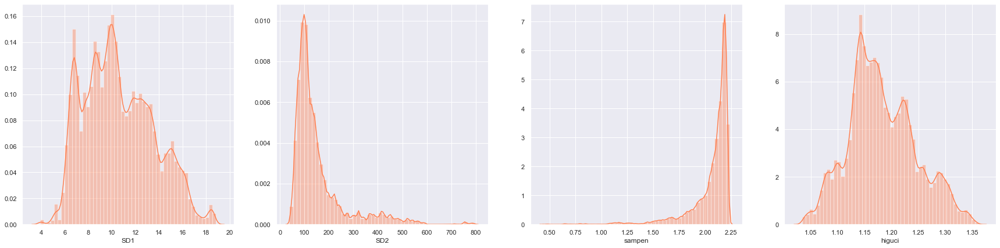

In [22]:
fig, axs = plt.subplots(ncols = 4, figsize = (30, 7))    
sns.distplot(heart_rate['SD1'], color='coral', kde=True, ax = axs[0])
sns.distplot(heart_rate['SD2'], color='coral', kde=True, ax = axs[1])  
sns.distplot(heart_rate['sampen'], color='coral', kde=True, ax = axs[2])  
sns.distplot(heart_rate['higuci'], color='coral', kde=True, ax = axs[3])  

**Time Domain Features Plots**

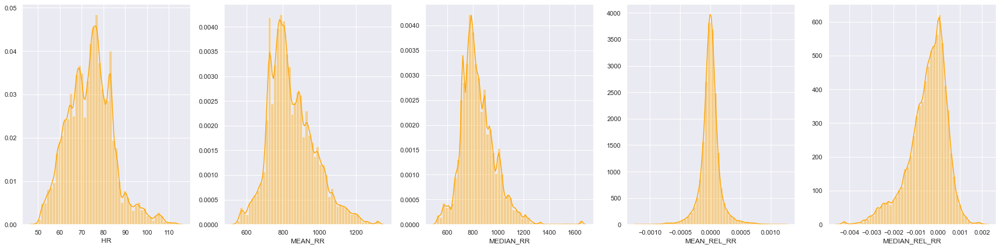

In [23]:
fig, axs = plt.subplots(ncols = 5, figsize = (30, 7)) 
sns.distplot(time_domain['HR'], color='orange', kde=True, ax = axs[0])
sns.distplot(time_domain['MEAN_RR'], color='orange', kde=True, ax = axs[1])
sns.distplot(time_domain['MEDIAN_RR'], color='orange', kde=True, ax = axs[2])
sns.distplot(time_domain['MEAN_REL_RR'], color='orange', kde=True, ax = axs[3])
sns.distplot(time_domain['MEDIAN_REL_RR'], color='orange', kde=True, ax = axs[4])

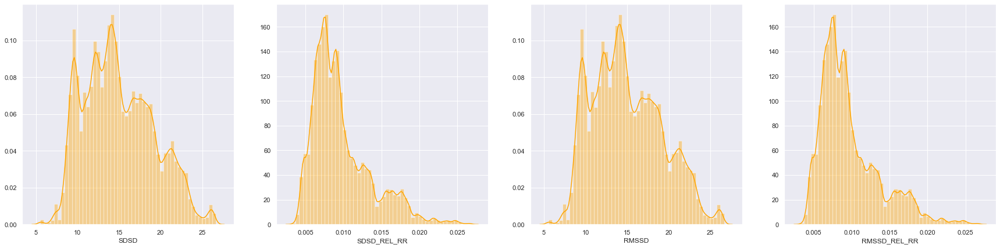

In [24]:
fig, axs = plt.subplots(ncols = 4, figsize = (30, 7))    
sns.distplot(time_domain['SDSD'], color='orange', kde=True, ax = axs[0])
sns.distplot(time_domain['SDSD_REL_RR'], color='orange', kde=True, ax = axs[1])
sns.distplot(time_domain['RMSSD'], color='orange', kde=True, ax = axs[2])
sns.distplot(time_domain['RMSSD_REL_RR'], color='orange', kde=True, ax = axs[3])

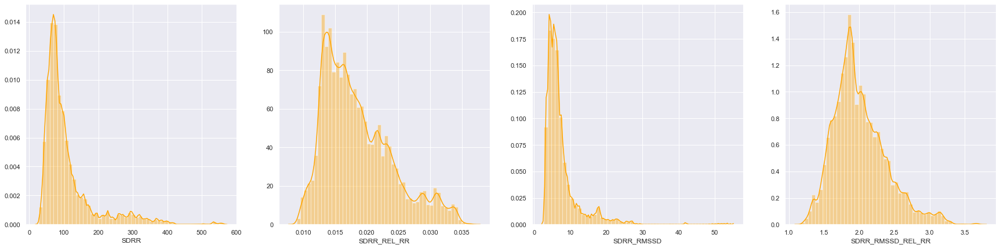

In [25]:
fig, axs = plt.subplots(ncols = 4, figsize = (30, 7))    
sns.distplot(time_domain['SDRR'], color='orange', kde=True, ax = axs[0])
sns.distplot(time_domain['SDRR_REL_RR'], color='orange', kde=True, ax = axs[1]) 
sns.distplot(time_domain['SDRR_RMSSD'], color='orange', kde=True, ax = axs[2])   
sns.distplot(time_domain['SDRR_RMSSD_REL_RR'], color='orange', kde=True, ax = axs[3])  

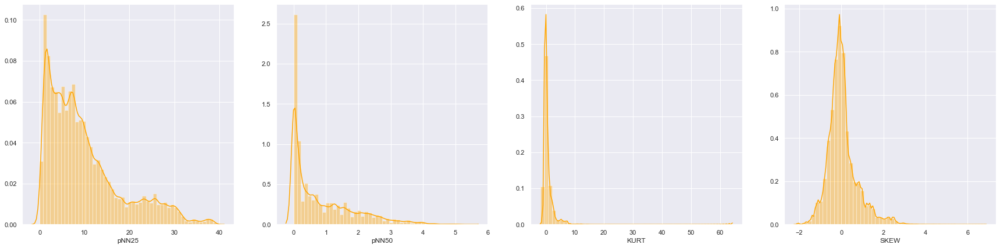

In [26]:
fig, axs = plt.subplots(ncols = 4, figsize = (30, 7)) 
sns.distplot(time_domain['pNN25'], color='orange', kde=True, ax = axs[0])
sns.distplot(time_domain['pNN50'], color='orange', kde=True, ax = axs[1])
sns.distplot(time_domain['KURT'], color='orange', kde=True, ax = axs[2])
sns.distplot(time_domain['SKEW'], color='orange', kde=True, ax = axs[3])

**Checking for Outliers**

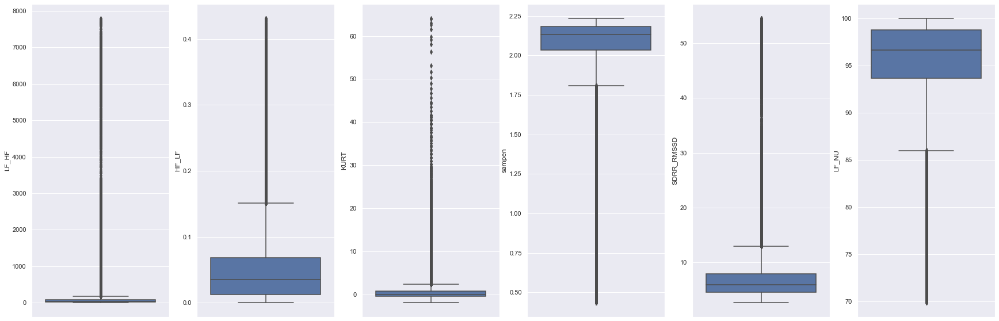

In [27]:
fig, axs = plt.subplots(ncols = 6, figsize = (30, 10))
sns.boxplot(df_train['LF_HF'], orient='v', ax = axs[0])
sns.boxplot(df_train['HF_LF'], orient='v', ax = axs[1])
sns.boxplot(df_train['KURT'], orient='v', ax = axs[2])
sns.boxplot(df_train['sampen'], orient='v', ax = axs[3])
sns.boxplot(df_train['SDRR_RMSSD'], orient='v', ax = axs[4])
sns.boxplot(df_train['LF_NU'], orient='v', ax = axs[5])

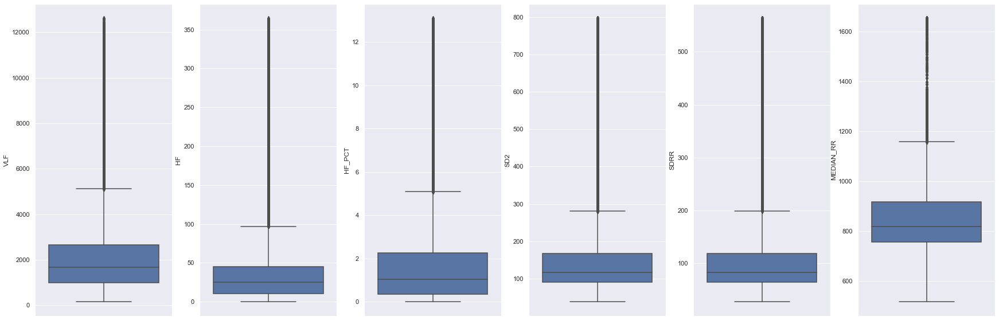

In [28]:
fig, axs = plt.subplots(ncols = 6, figsize = (30, 10))
sns.boxplot(df_train['VLF'], orient='v', ax = axs[0])
sns.boxplot(df_train['HF'], orient='v', ax = axs[1])
sns.boxplot(df_train['HF_PCT'], orient='v', ax = axs[2])
sns.boxplot(df_train['SD2'], orient='v', ax = axs[3])
sns.boxplot(df_train['SDRR'], orient='v', ax = axs[4])
sns.boxplot(df_train['MEDIAN_RR'], orient='v', ax = axs[5])

In [21]:
# Calculating Inter Quartile Range
Q1 = df_train.quantile(0.25)
Q3 = df_train.quantile(0.75)
IQR = Q3 - Q1

In [22]:
np.where((df_train < (Q1 - 1.5 * IQR)) | (df_train > (Q3 + 1.5 * IQR)))

(array([     1,      1,      4, ..., 369286, 369286, 369286], dtype=int64),
 array([13, 31, 27, ...,  6, 13, 22], dtype=int64))

In [23]:
# Selecting rows without outliers
df_train_out = df_train[~((df_train < (Q1 - 1.5 * IQR)) |(df_train > (Q3 + 1.5 * IQR))).any(axis=1)] 
print(df_train_out.shape)
print('There are', df_train_out.shape[0], 'rows without outliers and', df_train.shape[0]-df_train_out.shape[0], 'rows with outliers.')

(190701, 34)
There are 190701 rows without outliers and 178588 rows with outliers.


Outliers may negatively affect the performance of our model. We will attempt to deal with outliers later by replacing every outlier on the lower side by the lower whisker and replace every outlier on the upper side by the upper whisker.

**Dealing with Outliers**

In [24]:
# Creating a copy of the original dataset
df_mod = df_train.copy()

In [25]:
# Replace every outlier on the lower side by the lower whisker
for i, j in zip(np.where(df_mod < Q1 - 1.5 * IQR)[0], np.where(df_mod < Q1 - 1.5 * IQR)[1]):    
    whisker  = Q1 - 1.5 * IQR
    df_mod.iloc[i,j] = whisker[j]
    
# Replace every outlier on the upper side by the upper whisker    
for i, j in zip(np.where(df_mod > Q3 + 1.5 * IQR)[0], np.where(df_mod > Q3 + 1.5 * IQR)[1]):
    whisker  = Q3 + 1.5 * IQR
    df_mod.iloc[i,j] = whisker[j]

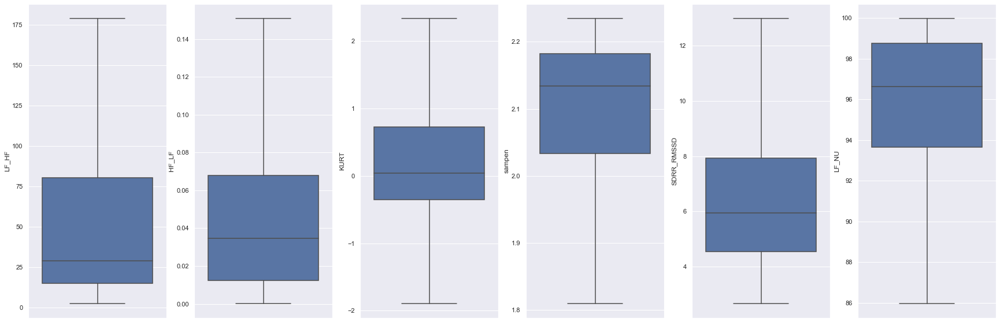

In [26]:
fig, axs = plt.subplots(ncols = 6, figsize = (30, 10))
sns.boxplot(df_mod['LF_HF'], orient='v', ax = axs[0])
sns.boxplot(df_mod['HF_LF'], orient='v', ax = axs[1])
sns.boxplot(df_mod['KURT'], orient='v', ax = axs[2])
sns.boxplot(df_mod['sampen'], orient='v', ax = axs[3])
sns.boxplot(df_mod['SDRR_RMSSD'], orient='v', ax = axs[4])
sns.boxplot(df_mod['LF_NU'], orient='v', ax = axs[5])

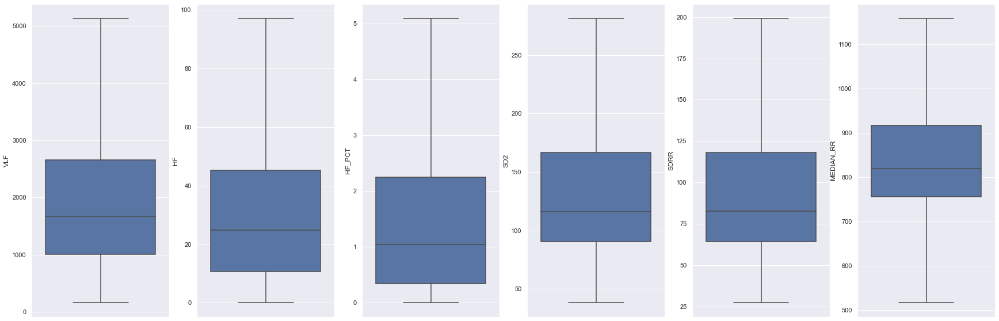

In [27]:
fig, axs = plt.subplots(ncols = 6, figsize = (30, 10))
sns.boxplot(df_mod['VLF'], orient='v', ax = axs[0])
sns.boxplot(df_mod['HF'], orient='v', ax = axs[1])
sns.boxplot(df_mod['HF_PCT'], orient='v', ax = axs[2])
sns.boxplot(df_mod['SD2'], orient='v', ax = axs[3])
sns.boxplot(df_mod['SDRR'], orient='v', ax = axs[4])
sns.boxplot(df_mod['MEDIAN_RR'], orient='v', ax = axs[5])

### Bi-variate Analysis

**Pair Plots**

The pairplot below shows an overview of how relevant attributes interacts with each other as well as the heart rate results. 

**Hint:** Double-click on the plots to maximize.

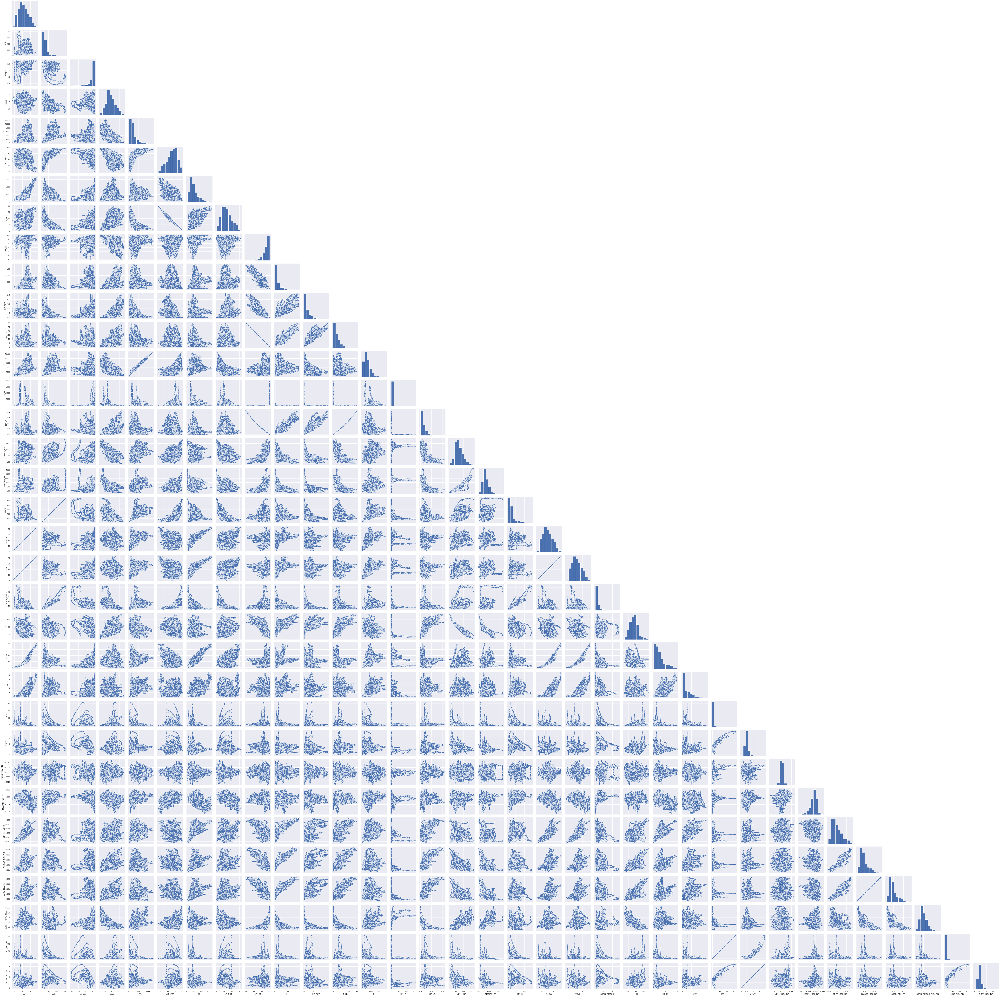

In [32]:
sns.pairplot(df_train, diag_kind = 'auto', corner = True, palette='muted')

Increased stress and anxiety triggers the body's defense system which ignites a spike in blood pressure and heart rate to send more oxygen to the brain and muscles via blood streams. Tachycardia refers to a fast resting heart rate, usually over 100 beats per minute. We need to figure out how many individuals from our sample who may be under stress at the time the measurement was taken.   

In [27]:
tach = df_train[df_train['HR'] > 100].shape[0]
print("There are", tach ,"people out of", df_train.shape[0], "people with a HR over 100 beats per minute.")

There are 6310 people out of 369289 people with a HR over 100 beats per minute.


We need to explore further to see the relationship between the condition of these indivuals at the time the measurement was taken and their heart rate.

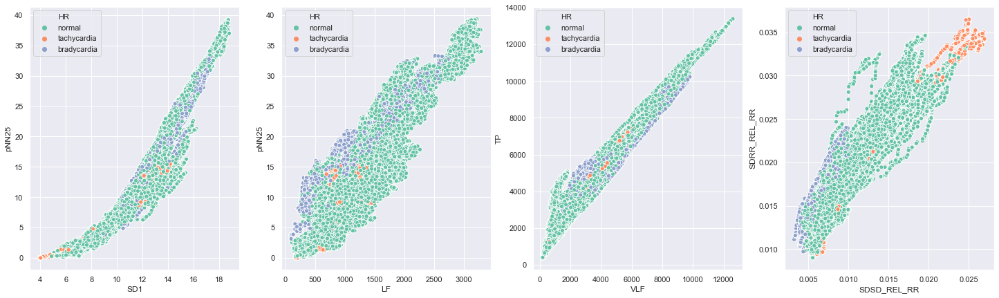

In [89]:
fig, axs = plt.subplots(ncols = 4, figsize = (25, 7))
sns.scatterplot(df_expl['SD1'], df_expl['pNN25'], hue=df_expl['HR'], palette='Set2', ax = axs[0])
sns.scatterplot(df_expl['LF'], df_expl['pNN25'], hue=df_expl['HR'], palette='Set2', ax = axs[1])
sns.scatterplot(df_expl['VLF'], df_expl['TP'], hue=df_expl['HR'], palette='Set2', ax = axs[2]) 
sns.scatterplot(df_expl['SDSD_REL_RR'], df_expl['SDRR_REL_RR'], hue=df_expl['HR'], palette='Set2', ax = axs[3]) 

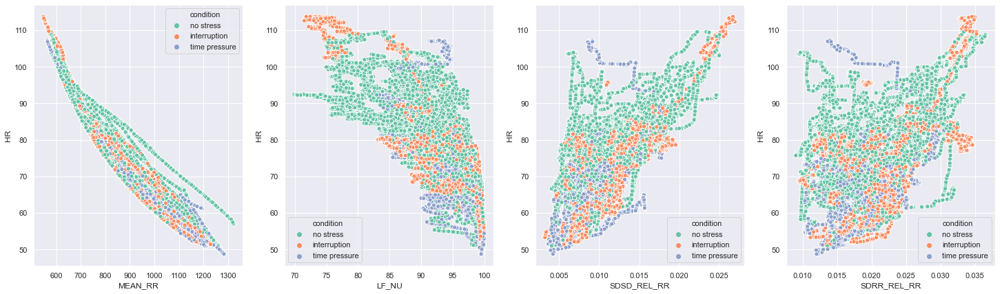

In [90]:
fig, axs = plt.subplots(ncols = 4, figsize = (25, 7))
sns.scatterplot(df_train['MEAN_RR'], df_train['HR'], hue=df_train['condition'], palette='Set2', ax = axs[0])
sns.scatterplot(df_train['LF_NU'], df_train['HR'], hue=df_train['condition'], palette='Set2', ax = axs[1])
sns.scatterplot(df_train['SDSD_REL_RR'], df_train['HR'], hue=df_train['condition'], palette='Set2', ax = axs[2]) 
sns.scatterplot(df_train['SDRR_REL_RR'], df_train['HR'], hue=df_train['condition'], palette='Set2', ax = axs[3]) 

**Correlation Heat Map**

The heatmap below shows an overview of the correlations between different attributes.

**Hint:** Double-click on the plots to maximize.

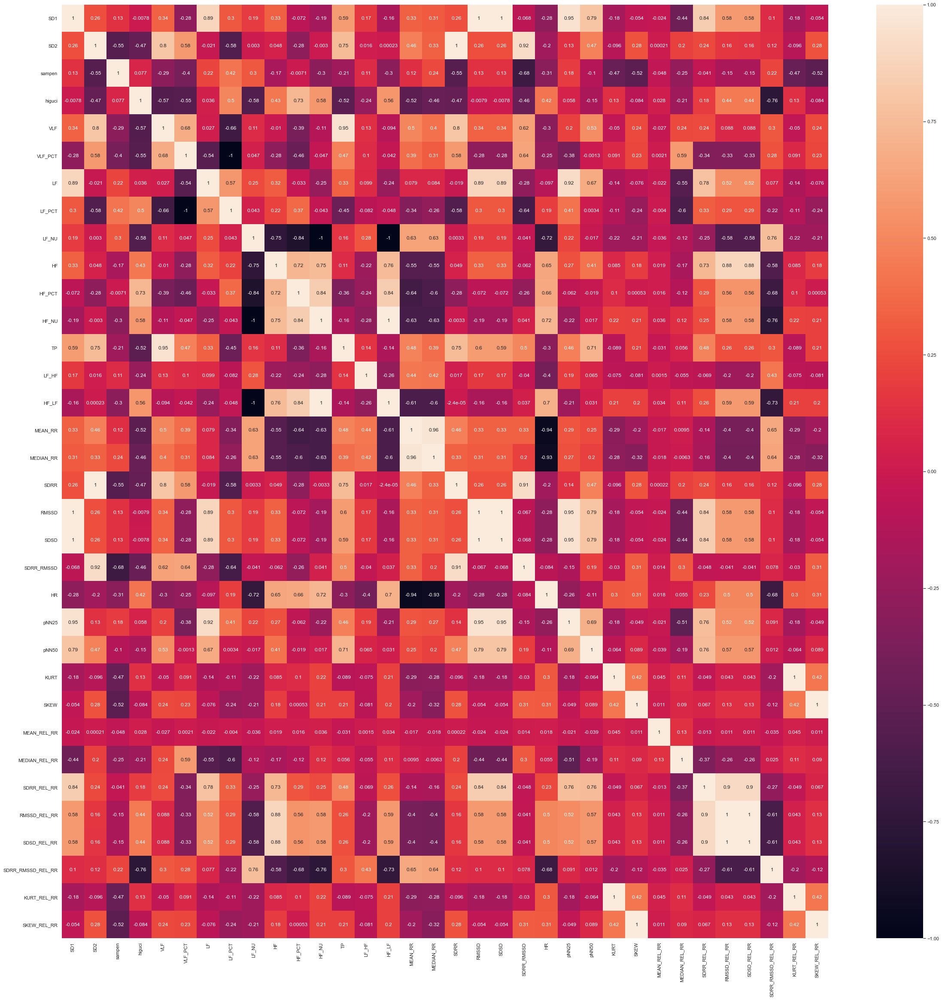

In [98]:
fig, ax = plt.subplots(figsize=(40,40))
sns.heatmap(df_train.corr(), annot=True)  

### Data Preparation and Train Test Split

In [28]:
df_mod = df_mod.drop(columns = ['RMSSD', 'RMSSD_REL_RR'])
df_mod.head(1)

,SD1,SD2,sampen,higuci,VLF,VLF_PCT,LF,LF_PCT,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,MEAN_RR,MEDIAN_RR,SDRR,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,KURT,SKEW,MEAN_REL_RR,MEDIAN_REL_RR,SDRR_REL_RR,SDSD_REL_RR,SDRR_RMSSD_REL_RR,KURT_REL_RR,SKEW_REL_RR
0,11.001565,199.061782,2.139754,1.163485,2661.894136,72.203287,1009.249419,27.375666,98.485263,15.522603,0.421047,1.514737,3686.666157,65.018055,0.01538,885.157845,853.76373,140.972741,15.553371,9.063146,69.499952,11.133333,0.533333,-0.856554,0.335218,-0.000203,-0.000179,0.01708,0.007969,2.143342,-0.856554,0.335218


**Datatype Check**

In [29]:
# Confirming datatypes are in the right format
df_mod.dtypes 

SD1                  float64
SD2                  float64
sampen               float64
higuci               float64
VLF                  float64
VLF_PCT              float64
LF                   float64
LF_PCT               float64
LF_NU                float64
HF                   float64
HF_PCT               float64
HF_NU                float64
TP                   float64
LF_HF                float64
HF_LF                float64
MEAN_RR              float64
MEDIAN_RR            float64
SDRR                 float64
SDSD                 float64
SDRR_RMSSD           float64
HR                   float64
pNN25                float64
pNN50                float64
KURT                 float64
SKEW                 float64
MEAN_REL_RR          float64
MEDIAN_REL_RR        float64
SDRR_REL_RR          float64
SDSD_REL_RR          float64
SDRR_RMSSD_REL_RR    float64
KURT_REL_RR          float64
SKEW_REL_RR          float64
dtype: object

**Train Validation Dataset Splits**

In [627]:
# df_sample = df_mod.sample(1000)

In [30]:
X = df_mod.drop(columns = 'HR')
y = df_mod['HR']

In [31]:
from sklearn.model_selection import train_test_split 
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = .1, random_state = 22) 

In [32]:
print(X_train.shape)
print(X_val.shape)

(332360, 31)
(36929, 31)


In [33]:
print(y_train.head())
print()
print(y_val.head())

16702     61.986119
358189    73.788360
278174    68.460965
194230    67.362314
303096    61.086719
Name: HR, dtype: float64

196520    81.518103
292147    76.858076
44398     74.360683
97068     66.980311
343422    81.447392
Name: HR, dtype: float64


**Scaling Dataset**

In [34]:
from sklearn.preprocessing import StandardScaler

In [35]:
# Scaling data to balance the high variance in distributions 
sc = StandardScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train),columns=X.columns)
X_val = pd.DataFrame(sc.transform(X_val),columns=X.columns)
X_train.head()

,SD1,SD2,sampen,higuci,VLF,VLF_PCT,LF,LF_PCT,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,MEAN_RR,MEDIAN_RR,SDRR,SDSD,SDRR_RMSSD,pNN25,pNN50,KURT,SKEW,MEAN_REL_RR,MEDIAN_REL_RR,SDRR_REL_RR,SDSD_REL_RR,SDRR_RMSSD_REL_RR,KURT_REL_RR,SKEW_REL_RR
0,0.748185,1.055681,-1.091779,0.303380,0.546331,0.482840,0.256582,-0.422932,0.870595,-0.742750,-0.837195,-0.870595,0.451364,0.573166,-0.857326,1.163615,0.788228,1.054960,0.748185,0.520927,-0.033593,0.560462,0.128790,1.458362,-0.290508,-0.414340,-0.160734,-0.062847,-0.319510,0.128790,1.458362
1,-1.168793,-0.971985,0.863948,0.676282,-0.888281,0.062663,-0.993805,-0.077419,-0.242511,-0.378218,0.191367,0.242511,-1.092186,-0.659597,0.210924,-0.238973,-0.150607,-0.974932,-1.168793,-0.541248,-0.982192,-0.887428,-0.712631,-0.216415,-0.032928,-0.339062,-1.083533,-0.674934,-0.639490,-0.712631,-0.216415
2,0.124402,0.144831,0.239168,-0.608748,0.339486,0.392963,0.191402,-0.327674,0.904499,-0.799324,-0.850971,-0.904499,0.261975,0.776473,-0.888467,0.365126,0.470723,0.143596,0.124402,0.027627,-0.275055,0.353620,0.939104,-0.985856,-0.691326,-0.615822,-0.018143,-0.465878,0.911660,0.939104,-0.985856
3,-0.658211,-0.143135,-0.251624,-0.303126,0.217615,1.049305,-0.803589,-1.021498,0.570429,-0.749928,-0.770264,-0.570429,-0.139649,-0.214309,-0.578131,0.449837,0.558297,-0.146287,-0.658211,0.261775,-0.671742,-0.887428,0.681680,-0.925934,0.795136,1.056706,-0.867099,-0.858565,0.361150,0.681680,-0.925934
4,1.602929,2.131599,-0.359559,-0.673992,2.215152,0.950139,1.203711,-0.901187,0.983573,-0.782832,-0.951977,-0.983573,2.503643,1.547032,-0.960792,1.427622,1.344698,2.132030,1.602929,1.032408,1.208210,2.904664,1.561208,1.757402,-2.220668,-1.122071,0.621299,0.049448,0.663411,1.561208,1.757402


### Model Creation

In [38]:
# Blank lists to append data
algo= []
R2_trn = []
R2_val = []
Adj_R2 = []
RMSE = []
MSE = []
MAE = []
cv_val = []
cv_mae = []

**Linear Regression**

In [39]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_val)

algo.append('Linear Regression')
R2_trn.append(lr.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_lr))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_lr)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_lr)))
MSE.append(mean_squared_error(y_val, y_pred_lr))
MAE.append(mean_absolute_error(y_val, y_pred_lr))

**Ridge Regression**

In [40]:
rg = Ridge(alpha=0.95, random_state=1)
rg.fit(X_train, y_train) 
y_pred_rg = rg.predict(X_val)

algo.append('Ridge Regression')
R2_trn.append(rg.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_rg))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_rg)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_rg)))
MSE.append(mean_squared_error(y_val, y_pred_rg))
MAE.append(mean_absolute_error(y_val, y_pred_rg))

**Lasso Regression**

In [41]:
ls = Lasso(alpha=0, random_state=1)
ls.fit(X_train, y_train)
y_pred_ls = ls.predict(X_val)

algo.append('Lasso Regression')
R2_trn.append(ls.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_ls))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_ls)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_ls)))
MSE.append(mean_squared_error(y_val, y_pred_ls))
MAE.append(mean_absolute_error(y_val, y_pred_ls))

**K-Near Neighbors Regression**

In [42]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_val)

algo.append('K-Near Neighbors')
R2_trn.append(knn.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_knn))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_knn)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_knn)))
MSE.append(mean_squared_error(y_val, y_pred_knn))
MAE.append(mean_absolute_error(y_val, y_pred_knn))

**Decision Tree Regression**

In [45]:
dt = DecisionTreeRegressor(random_state=1)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_val)

algo.append('Decision Tree')
R2_trn.append(dt.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_dt))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_dt)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_dt)))
MSE.append(mean_squared_error(y_val, y_pred_dt))
MAE.append(mean_absolute_error(y_val, y_pred_dt))

**Random Forest Regression**

In [46]:
rf = RandomForestRegressor(random_state=1, n_estimators=20, max_depth=50)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_val)

algo.append('Random Forest')
R2_trn.append(rf.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_rf))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_rf)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_rf)))
MSE.append(mean_squared_error(y_val, y_pred_rf))
MAE.append(mean_absolute_error(y_val, y_pred_rf))

**Bagging Regression**

In [47]:
bg = BaggingRegressor(random_state=1)
bg.fit(X_train, y_train)
y_pred_bg = bg.predict(X_val)

algo.append('Bagging')
R2_trn.append(bg.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_bg))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_bg)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_bg)))
MSE.append(mean_squared_error(y_val, y_pred_bg))
MAE.append(mean_absolute_error(y_val, y_pred_bg))

**AdaBoost Regression**

In [48]:
ab = AdaBoostRegressor(random_state=1)
ab.fit(X_train, y_train)
y_pred_ab = ab.predict(X_val)

algo.append('AdaBoost')
R2_trn.append(ab.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_ab))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_ab)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_ab)))
MSE.append(mean_squared_error(y_val, y_pred_ab))
MAE.append(mean_absolute_error(y_val, y_pred_ab))

**Gradient Boosting Regression**

In [49]:
gb = GradientBoostingRegressor(random_state=1)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_val)

algo.append('Gradient Boosting')
R2_trn.append(gb.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_gb))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_gb)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_gb)))
MSE.append(mean_squared_error(y_val, y_pred_gb))
MAE.append(mean_absolute_error(y_val, y_pred_gb))

**Histogram Gradient Boosting Regressor**

In [50]:
from sklearn.experimental import enable_hist_gradient_boosting  
from sklearn.ensemble import HistGradientBoostingRegressor

hgb = HistGradientBoostingRegressor(random_state=1)
hgb.fit(X_train, y_train)
y_pred_hgb = gb.predict(X_val)    
    
algo.append('Hist. Gradient Boosting')
R2_trn.append(hgb.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_hgb))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_hgb)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_hgb)))
MSE.append(mean_squared_error(y_val, y_pred_hgb))
MAE.append(mean_absolute_error(y_val, y_pred_hgb))

**xGBoost Regressor**

In [51]:
from xgboost import XGBRegressor

xgb = XGBRegressor(random_state=1)
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_val)

algo.append('xGBoost Regressor')
R2_trn.append(xgb.score(X_train, y_train))
R2_val.append(r2_score(y_val, y_pred_xgb))
Adj_R2.append(1-(1-(r2_score(y_val, y_pred_xgb)))*(len(y_val)-1)/(len(y_val)-len(X_val.columns)-1))
RMSE.append(np.sqrt(mean_squared_error(y_val, y_pred_xgb)))
MSE.append(mean_squared_error(y_val, y_pred_xgb))
MAE.append(mean_absolute_error(y_val, y_pred_xgb))

**Results (Default)**

In [52]:
print("RESULTS TABLE (DEFAULT SETTINGS)")
results = pd.DataFrame()
results['Model'] = algo
results['R2 Train'] = R2_trn
results['R2 Val'] = R2_val
results['Adj R2'] = Adj_R2
results['RMSE'] = RMSE
results['MSE'] = MSE
results['MAE'] = MAE
#results['CV R2'] = cv_val
#results['CV MAE'] = cv_mae
results = results.set_index('Model')
results

RESULTS TABLE (DEFAULT SETTINGS)


,R2 Train,R2 Val,Adj R2,RMSE,MSE,MAE
Model,,,,,,
Linear Regression,0.982788,0.982818,0.982804,1.319184,1.740246,0.903518
Ridge Regression,0.982519,0.982549,0.982534,1.329503,1.767578,0.910486
Lasso Regression,0.982398,0.982427,0.982412,1.334142,1.779934,0.914755
K-Near Neighbors,0.999985,0.999969,0.999969,0.056376,0.003178,0.029203
Decision Tree,1.000000,0.999981,0.999981,0.044256,0.001959,0.010730
Random Forest,0.999998,0.999994,0.999994,0.024885,0.000619,0.007157
Bagging,0.999997,0.999990,0.999990,0.031276,0.000978,0.008267
AdaBoost,0.964883,0.964603,0.964573,1.893465,3.585209,1.629063
Gradient Boosting,0.997192,0.997139,0.997136,0.538344,0.289814,0.350547


The table above shows the results of all the models built in default settings. Based on the data above, Gradient Boost and Random Forest are the best models. 

## Model Tuning

In [46]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

### Random Forest